# 1 Author

**Student Name**: Anushree Vishnoi 
**Student ID**: 220756349 

# 2 Problem formulation

Dataset used - MLEnd London Sounds
Collection of 7 secs audio recording from multiple locations outdoor and indoor locations is London

Machine learning problem description - 
Input an audio segment (independent variable) and predict whether the audio segment has been recorded indoors or outdoors (dependent variable)

Uniqueness of the problem - Its quite interesting as a poblem beacuse it helps to recognize the accoustic environment of the audio filming spot. The solution helps  is to find whether the recording location is outdoor/indoor from audio signal without actually in person being present there. 




# 3 Machine learning pipeline

- Collection of audio recording 
- Production of the data samples 
- Dowloading and loading of dataset 
- Understanding and uploading the datset sample.
- Problem formulation - To recognise the filming spot - accoustic environment
- MLEndLS dataset is a collection of samples described by 5 attributes:Audio, Area, Spot, Whether indoor or outdoor and Participant 
- Extracting feature like Power,Pitch - mean, Pitch - standard deviation and Fraction of voiced region
-  Defining a function(getXy) using the 4 audio features used as predictors (X) and a binary label (y) that indicates whether the recording is indoors (y=1) or outdoors (y=0).
- Building the SVM model on the test data to get the training and validation accuracy
- Checking the performance and then normalising the predictors to compare the taining and validation accuracy




# 4 Transformation stage

- Using the  complete data samples 2500
- Extracting audio feature Power, Pitch - mean, Pitch - standard deviation and Fraction of voiced region
-  Defining a function using the 4 audio features which are used as the predictors (X) and a binary label (y) that indicates whether the recording is indoors (y=1) or outdoors (y=0)
- This would result in a numpy array of the 4 features and binary label of the filming locations as indoor and outdoor. Passing the function through all the samples to ge the filming locations.




# Environment set up -  MLEnd mini-project


Creating a folder named 'MLEndLS' in 'Data' in 'MyDrive' on https://drive.google.com/

Loading a few useful Python libraries and mounting personal Google Drive storage system (i.e. making it available, so that Colab can access it).

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
from google.colab import drive

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import os, sys, re, pickle, glob
import urllib.request
import zipfile

import IPython.display as ipd
from tqdm import tqdm
import librosa

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Data download

In this section we have downloaded the 2500 audio samples of the MLEnd London Sounds Dataset. 

The file was downloaded from a given loaction and then uploaded in MyDrive in MLEndLS folder as a zip file.

The next step is to download the file 'MLEndLS.zip' into the folder 'MyDrive/Data/MLEndLS'.

Ran the following cell to check that the MLEndLS folder contains the file 'MLEndLS.zip':

In [3]:
path = '/content/drive/MyDrive/Data/MLEndLS'
os.listdir(path)

['MLEndLS.zip', 'Sample']

# 7. All about the dataset sample

Let's unzipping the sample data:

In [4]:
directory_to_extract_to = '/content/drive/MyDrive/Data/MLEndLS/sample/'
zip_path = '/content/drive/MyDrive/Data/MLEndLS/MLEndLS.zip'
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(directory_to_extract_to)



And now checking the number of audio files we have:

In [5]:
sample_path = '/content/drive/MyDrive/Data/MLEndLS/sample/MLEndLS/*.wav'
files = glob.glob(sample_path)
len(files)

2500

This figure (2500) corresponds to the number of **items** or **samples** in our dataset. Let's listen to some random audio files:

In [6]:
for _ in range(5):
  n = np.random.randint(98)
  display(ipd.Audio(files[n]))

Problem formulation - recognising the filming spot - acoustic environment

The MLEndLS Dataset is a collection of samples described by 5 attributes:
- Audio
- Area
- Spot
- Whether indoor or outdoor
- Participant

Uploading the CSV file 'MLEndLS.csv'. Then ning the next cell to load it into a Pandas DataFrame and print its contents.


In [7]:
MLENDLS_df = pd.read_csv('./MLEndLS.csv').set_index('file_id') 
MLENDLS_df

,area,spot,in_out,Participant
file_id,,,,
0001.wav,british,street,outdoor,S151
0002.wav,kensington,dinosaur,indoor,S127
0003.wav,campus,square,outdoor,S18
0004.wav,kensington,hintze,indoor,S179
0005.wav,campus,square,outdoor,S176
...,...,...,...,...
2496.wav,westend,trafalgar,outdoor,S151
2497.wav,campus,square,outdoor,S6
2498.wav,westend,national,indoor,S96


The audio attribute is a complex one and cannot be directly inserted in a DataFrame structure. Instead, we have the name of the corresponding audio files, e.g. '3086.wav', which in our case are stored in the '/content/drive/MyDrive/Data/MLEndLS/sample/MLEndLS_Sample/' folder. 

The next cell prints the contents of the folder that stores our sample audio files. The names of the WAV files correspond to one of the `file_id` entries in the `MLEndLS_df` DataFrame.

In [8]:
for file in files:
  print(file.split('/')[-1])

0001.wav
0002.wav
0003.wav
0004.wav
0005.wav
0006.wav
0007.wav
0008.wav
0009.wav
0010.wav
0011.wav
0012.wav
0013.wav
0014.wav
0015.wav
0016.wav
0017.wav
0018.wav
0019.wav
0020.wav
0021.wav
0022.wav
0023.wav
0024.wav
0025.wav
0026.wav
0027.wav
0028.wav
0029.wav
0030.wav
0031.wav
0032.wav
0033.wav
0034.wav
0035.wav
0036.wav
0037.wav
0038.wav
0039.wav
0040.wav
0041.wav
0042.wav
0043.wav
0044.wav
0045.wav
0046.wav
0047.wav
0048.wav
0049.wav
0050.wav
0051.wav
0052.wav
0053.wav
0054.wav
0055.wav
0056.wav
0057.wav
0058.wav
0059.wav
0060.wav
0061.wav
0062.wav
0063.wav
0064.wav
0065.wav
0066.wav
0067.wav
0068.wav
0069.wav
0070.wav
0071.wav
0072.wav
0073.wav
0074.wav
0075.wav
0076.wav
0077.wav
0078.wav
0079.wav
0080.wav
0081.wav
0082.wav
0083.wav
0084.wav
0085.wav
0086.wav
0087.wav
0088.wav
0089.wav
0090.wav
0091.wav
0092.wav
0093.wav
0094.wav
0095.wav
0096.wav
0097.wav
0098.wav
0099.wav
0100.wav
0101.wav
0102.wav
0103.wav
0104.wav
0105.wav
0106.wav
0107.wav
0108.wav
0109.wav
0110.wav
0111.wav
0

# Feature extraction : Pitch

Audio files are complex data types. Specifically they are **discrete signals** or **time series**, consisting of values on a 1D temporal grid. These values are known as *samples* themselves, which might be a bit confusing, as we have used this term to refer to the *items* in our dataset. The **sampling frequency** is the rate at which samples in an audio file are produced. For instance a sampling frequency of 5HZ indicates that 5 produce 5 samples per second, or 1 sample every 0.2 s.

Plotting one of our audio signals:

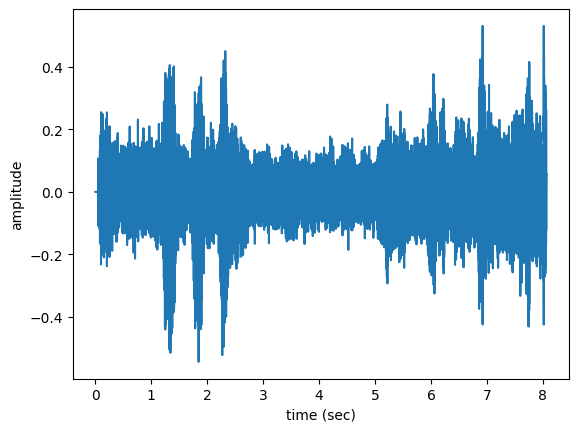

In [9]:
n=92
fs = None # Sampling frequency
x, fs = librosa.load(files[n],sr=fs)
t = np.arange(len(x))/fs
plt.plot(t,x)
plt.xlabel('time (sec)')
plt.ylabel('amplitude')
plt.show()
display(ipd.Audio(files[n]))

Can you tell whether you are listening to an indoors or outdoors location? Does it agree with the values shown in the ``` MLENDLS_df ``` dataframe? Let's check it:
 

In [10]:
MLENDLS_df.loc[files[n].split('/')[-1]]

area           kensington
spot             dinosaur
in_out             indoor
Participant          S167
Name: 0093.wav, dtype: object

Note that we are using the name of the audio file as the index in the Pandas DataFrame. By changing the value of `n` in the previous cell, we can listen to other examples. 

Reviewing complex audio signals. looking at the number of samples (i.e. time series samples) in one of our audio files:

In [11]:
n=0
x, fs = librosa.load(files[n],sr=fs)
print('This audio signal has', len(x), 'samples')

This audio signal has 422919 samples


Since we are using raw audio signal as the input of a machine learning model, we will be operating in a predictor space consisting of hundreds of thousands of dimensions. Comparing this figure with the number of items (i.e. recordings) that we have. Since we do not have enough samples to train a model that takes one of these audio signals as an input we shall take a different approach.

One approach to deal with this huge dimensionality is to extract a few features from the signals and use those features as predictors instead. In this notebook we will use four audio features, namely:


1.   Power.
2.   Pitch - mean.
3.   Pitch - standard deviation.
4.   Fraction of voiced region.

In the next cell, we define a new function that gets the pitch of an audio signal 

In [12]:
def getPitch(x,fs,winLen=0.02):
  #winLen = 0.02 
  p = winLen*fs
  frame_length = int(2**int(p-1).bit_length())
  hop_length = frame_length//2
  f0, voiced_flag, voiced_probs = librosa.pyin(y=x, fmin=80, fmax=450, sr=fs,
                                                 frame_length=frame_length,hop_length=hop_length)
  return f0,voiced_flag

Consider the problem of determining whether the filming spot is indoors or outdoors. Then next cell defines a function that takes a collection of audio files together with a CSV file and creates a NumPy array containing the 4 audio features used as predictors (`X`) and a binary label (`y`) that indicates whether the recording is indoors (`y=1`) or outdoors (`y=0`).

In [13]:
def getXy(files,labels_file, scale_audio=False, onlySingleDigit=False):
  X,y =[],[]
  for file in tqdm(files):
    try:
      fileID = file.split('/')[-1]
      file_name = file.split('/')[-1]
      yi = labels_file.loc[fileID]['in_out']=='indoor'

      fs = None # if None, fs would be 22050
      x, fs = librosa.load(file,sr=fs)
      if scale_audio: x = x/np.max(np.abs(x))
      f0, voiced_flag = getPitch(x,fs,winLen=0.02)
      
      power = np.sum(x**2)/len(x)
      pitch_mean = np.nanmean(f0) if np.mean(np.isnan(f0))<1 else 0
      pitch_std  = np.nanstd(f0) if np.mean(np.isnan(f0))<1 else 0
      voiced_fr = np.mean(voiced_flag)

      xi = [power,pitch_mean,pitch_std,voiced_fr]
      X.append(xi)
      y.append(yi)

    except:
      pass
  return np.array(X),np.array(y)

Applying `getXy` to the subsample and obtain the NumPy predictor array (`X`) and a binary label (`y`). This could take a while for processing each of the 2500 audio signals. 

In [14]:
X,y = getXy(files, labels_file=MLENDLS_df, scale_audio=True, onlySingleDigit=True)

  1%|▏         | 32/2500 [00:51<58:51,  1.43s/it]<ipython-input-13-2283551f2f49>:11: RuntimeWarning: invalid value encountered in true_divide
  if scale_audio: x = x/np.max(np.abs(x))
100%|██████████| 2500/2500 [58:56<00:00,  1.41s/it]


The next cell shows the shape of `X` and `y` and prints the labels vector `y`:

In [15]:
print('The shape of X is', X.shape) 
print('The shape of y is', y.shape)
print('The labels vector is', y)


The shape of X is (2498, 4)
The shape of y is (2498,)
The labels vector is [False  True False ...  True  True  True]


As we can see, we have 2498 items consisting of 4 features (stored in `X`) and one binary label (stored in `y`). Is our dataset balanced? Let's have a look:

In [16]:
print(' The number of indoor recordings is ', np.count_nonzero(y))
print(' The number of outdoor recordings is ', y.size - np.count_nonzero(y))

 The number of indoor recordings is  1181
 The number of outdoor recordings is  1317


# 5 Modeling: Support Vector Machines

- Building a support vector machine (SVM) model for the predictive task of identifying the type of filming spot (indoors/outdoors) using the dataset that we have just created.

- Using the SVM method provided by scikit-learn and will split the dataset defined by X and y into a training set and a validation set.



# 6 Methodology 

- Identifying the number of items in the training and validation sets 

- Now fitting an SVM model and printing both the training accuracty and validation accuracy.


In [17]:
from sklearn import svm
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X,y,test_size=0.3)
X_train.shape, X_val.shape, y_train.shape, y_val.shape

((1748, 4), (750, 4), (1748,), (750,))

1. X_train is 70% to X_val is 30%

In [18]:
model  = svm.SVC(C=1)
model.fit(X_train,y_train)

yt_p = model.predict(X_train)
yv_p = model.predict(X_val)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))
print('The support vectors are', model.support_vectors_.shape)

Training Accuracy 0.5274599542334096
Validation  Accuracy 0.528
The support vectors are (1661, 4)


Comparing the training and validation accuracies. The model accuracy is not very high but there dosen't seem to be overfitting or underfitting.We can change the training and validation sample proportion and check at 60 to 40.

First let's try by normalising the predictors, to see if the performance improves.


In [19]:
mean = X_train.mean(0)
sd =  X_train.std(0)

X_train = (X_train-mean)/sd
X_val  = (X_val-mean)/sd

model  = svm.SVC(C=1,gamma=2)
model.fit(X_train,y_train)

yt_p = model.predict(X_train)
yv_p = model.predict(X_val)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))
print('The support vectors are', model.support_vectors_.shape)

Training Accuracy 0.6807780320366132
Validation  Accuracy 0.5746666666666667
The support vectors are (1577, 4)


Post normalisation the performance has increased to 68.08 for training dataset and 57.47 for the validation dataset but the difference between the training and validation accuracy gap has also increased which is not in the favour of the experiment.

2. Chaging the sample proportion to X_train is 60% to X_val is 40%

In [20]:
from sklearn import svm
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X,y,test_size=0.4)
X_train.shape, X_val.shape, y_train.shape, y_val.shape

((1498, 4), (1000, 4), (1498,), (1000,))

In [21]:
model  = svm.SVC(C=1)
model.fit(X_train,y_train)

yt_p = model.predict(X_train)
yv_p = model.predict(X_val)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))
print('The support vectors are', model.support_vectors_.shape)

Training Accuracy 0.5353805073431241
Validation  Accuracy 0.515
The support vectors are (1408, 4)


In [22]:
mean = X_train.mean(0)
sd =  X_train.std(0)

X_train = (X_train-mean)/sd
X_val  = (X_val-mean)/sd

model  = svm.SVC(C=1,gamma=2)
model.fit(X_train,y_train)

yt_p = model.predict(X_train)
yv_p = model.predict(X_val)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))
print('The support vectors are', model.support_vectors_.shape)

Training Accuracy 0.6728971962616822
Validation  Accuracy 0.575
The support vectors are (1390, 4)


Post changing the sample split proportion for training and validation we see that the post normalisation training accuracy has redudced to 67 from 68.08 and the validation accuracy has increased by almost the same amount to 57.50 

# 8 Result

- On changing the sample split proportion for training and validation obserbvations:
- post normalisation training accuracy has redudced to 67 from 68.76 (post normalisation) but the 
- Validation accuracy has increased by the same amount to 57.50 from 52.47 (post normalisation)
- The difference between the accuracies of the normalised training and validation datasets has reduced slightly
- hence the second model seem to be a better model compared to the first one



# 9 Conclusions

- Since the second model gives us slightly better results second model is better in terms of the difference between the training & validation set as compared to the first model

- As improvements, we could extract additional audio feature or use other models - Random forest classifier, KNN classification

- The Mel spectrogram is used to provide models with sound information similar to what a human would perceive

-Other additional feature extraction could be of mfccs, amplitude envelope 